# Customer Segmentation of a Grocey Store

The goal of this project is to analyze customer transactions in order to investigate and inerpret customer behaviours of a certain supplier.

I will conduct exploratory data analysis on the data, before employing a variety of dimensionality reduction tecjniques, ranging from introductory to more advanced.Then, I will visualize the cleaned data, before clustering our customers based on their behaviour. Finally, I will use Plotly to visualize the clusters interactively in order to analyze them and their differences.


## Project Outline
<ol>
    <li>Introduction</li>
    <li>Exploratory Data Analysis</li>
    <li>Principal Component Analysis</li>
    <li>Kernel Principal Component Analysis</li>
    <li>K-Means Clustering with Elbow Method</li>
    <li>Interactive Cluster Analysis</li>
</ol>

In [1]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

import plotly.graph_objects as go

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1: Introduction

[The dataset](https://archive.ics.uci.edu/ml/datasets/Wholesale+customers) I will be using was collated by Margarida G.M.S. Cardoso, and comprises annual spending across different types of retail products (e.g., Frozen, Grocery, Delicatessen, etc.). I will use unsupervised ML methods to reduce the dimensionality of this data, and plot the resulting 2-D data, and investigate what the models are learning.

In [3]:
df = pd.read_csv('/content/drive/MyDrive/customer_segmentation/Wholesale customers data.csv')
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


Note that the `Channel` and `Region` are categorical variables! Therefore, we have to deal with them as such in our investigation. For ease of understanding, we will be mapping the corresponding channels ad locations to the dataset. The names can be located in the [dataset description](https://archive.ics.uci.edu/ml/datasets/Wholesale+customers)

Additionally, the last column name is mispelled and will need to be corrected accordingly.

In [4]:
# renaming the last column
df = df.rename(columns = {'Delicassen':'Delicatessen'})

# mapping the names to the categorical variables
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2:'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2:'Porto', 3:'Other'})

# check
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [5]:
df.columns

Index(['Channel', 'Region', 'Fresh', 'Milk', 'Grocery', 'Frozen',
       'Detergents_Paper', 'Delicatessen'],
      dtype='object')

In [6]:
all_features = ['Channel', 
                'Region', 
                'Fresh', 
                'Milk', 
                'Grocery', 
                'Frozen', 
                'Detergents_Paper', 
                'Delicatessen']

features =  ['Fresh', 
             'Milk', 
             'Grocery', 
             'Frozen', 
             'Detergents_Paper', 
             'Delicatessen']

In [7]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [8]:
df[['Channel', 'Region']].describe()

,Channel,Region
count,440,440
unique,2,3
top,HoReCa,Other
freq,298,316


In [9]:
# save the dataset 
df.to_csv('data_processed.csv', index=False)

## 2: Exploratory Data Analysis

Let's take a closer look at our data!

In [10]:
df.Channel.value_counts()

HoReCa    298
Retail    142
Name: Channel, dtype: int64

In [11]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

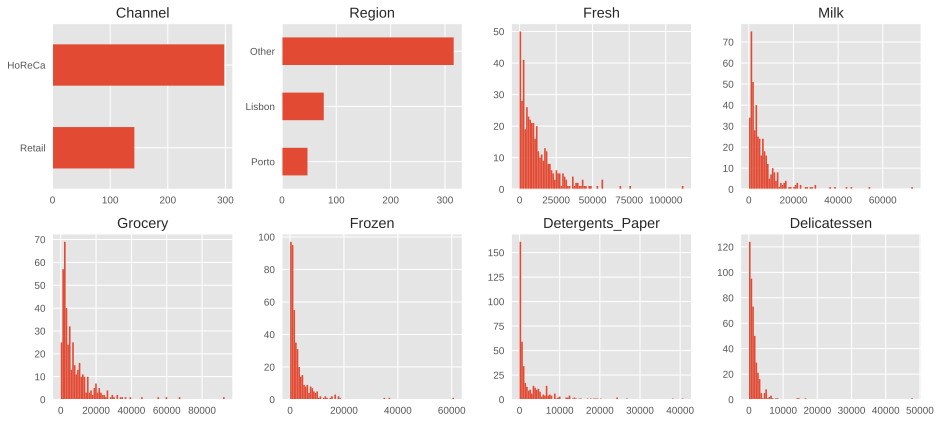

In [12]:
fig, axs = plt.subplots(2, 4, figsize=(13, 6))

for feature, ax in zip(all_features, axs.ravel()):
    if (feature == 'Channel') | (feature == 'Region'):
        df[feature].value_counts().sort_values(ascending=True).plot.barh(ax=ax)
    else:
        ax.hist(df[feature], bins=100)
    ax.set_title(feature)
plt.tight_layout()

<Figure size 720x720 with 0 Axes>

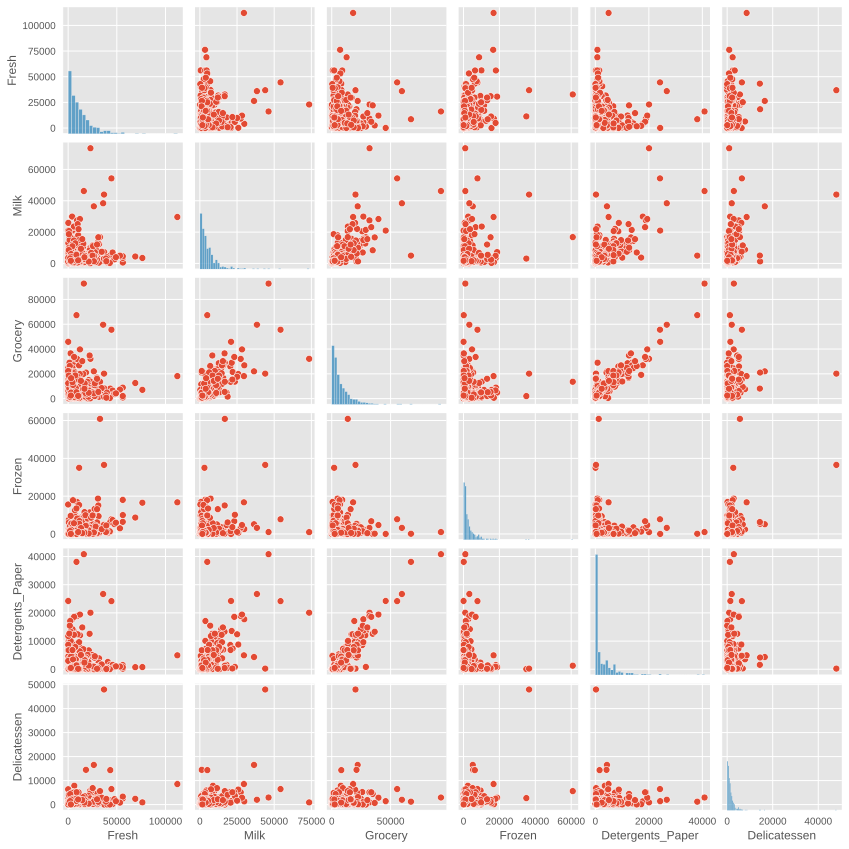

In [13]:
# plotting the pairplot

plt.figure(figsize=(10,10))
sns.pairplot(df, vars=features, height=2, aspect=1);

## 3: Principal Component Analysis
Having a large number of dimensions in the feature space can mean that the volume of that space is very large, and in turn, the points that we have in that space (rows of data) often represent a small and non-representative sample. This can dramatically impact the performance of machine learning algorithms fit on data with many input features, generally referred to as the "curse of dimensionality". Therefore, it is often desirable to reduce the number of input features. This reduces the number of dimensions of the feature space, hence the name ["dimensionality reduction"](https://machinelearningmastery.com/principal-components-analysis-for-dimensionality-reduction-in-python/#:~:text=for%20Dimensionality%20Reduction-,Dimensionality%20Reduction%20and%20PCA,to%20predict%20the%20target%20variable.)

Principal Component Analysis (PCA) is a is a technique stemming from linear algebra where data with $m$-columns (features) is projected into a subspace with $m$ or fewer columns, whilst retaining the essence of the original data. The PCA method can be described and implemented using the tools of linear algebra, specifically a matrix decomposition like an Eigendecomposition or SVD.

Since PCA finds directions in which variance is maximized, PCA is highly biased by large differences in standard deviations, as those we have in our dataset. Consequently, we need to standardize our features prior to running the PCA.

In [14]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [15]:
data = df[features].to_numpy()
data.shape

(440, 6)

The data currently has 6 numerical features, i.e., six dimensions

In [16]:
# scaling the data
scaler = StandardScaler()
data = scaler.fit_transform(data)

# check the scaling
data[:, 0].std()

1.0

In [17]:
data

array([[ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
        -0.06633906],
       [-0.39130197,  0.54445767,  0.17031835, -0.27013618,  0.08640684,
         0.08915105],
       [-0.44702926,  0.40853771, -0.0281571 , -0.13753572,  0.13323164,
         2.24329255],
       ...,
       [ 0.20032554,  1.31467078,  2.34838631, -0.54337975,  2.51121768,
         0.12145607],
       [-0.13538389, -0.51753572, -0.60251388, -0.41944059, -0.56977032,
         0.21304614],
       [-0.72930698, -0.5559243 , -0.57322717, -0.62009417, -0.50488752,
        -0.52286938]])

In [18]:
# save the standardized dataset
np.save('training_data.npy', data)

In [19]:
# conduct the PCA, I am going to reduce the number of dimensions to 2
pca = PCA(n_components = 2)

# instantiate the results to a variable
res_pca = pca.fit_transform(data)

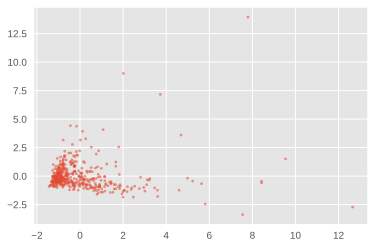

In [20]:
# visualize the PCA results
plt.scatter(res_pca[:,0], res_pca[:,1], s=5,alpha=0.5);

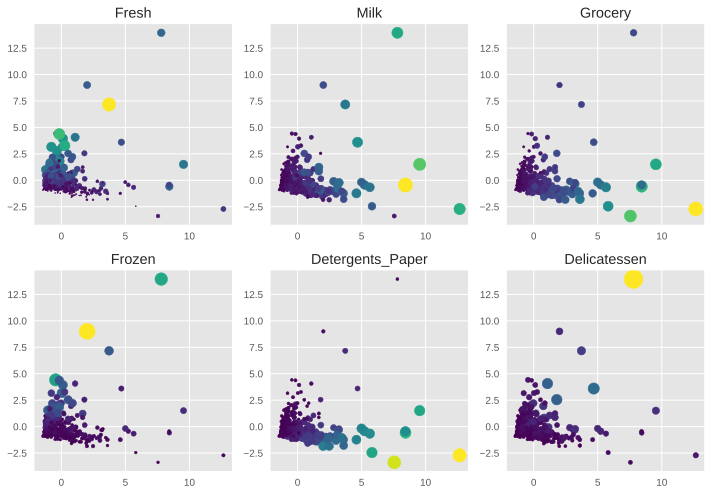

In [21]:
fig, axs = plt.subplots(2, 3, figsize=(10, 7))

for feature, ax in zip(features, axs.ravel()):
    cmap = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    cols = df[feature]
    ax.scatter(res_pca[:,0], res_pca[:,1], s=sizes, c=cols, cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

__Insights:__ Single clusters with a bunch of outliers as I move outward. Doesn't seem the PCA worked

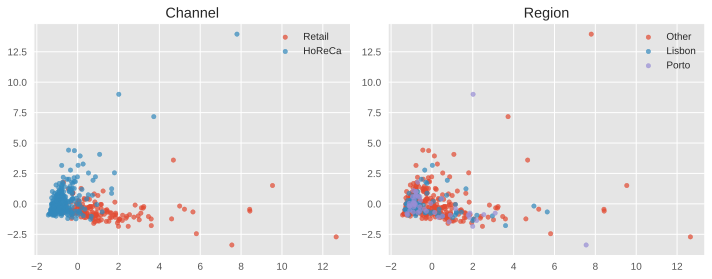

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    
    for unique_val in df[feature].unique():
        ax.scatter(res_pca[df[feature]==unique_val, 0], 
                   res_pca[df[feature]==unique_val, 1], 
                   label=unique_val, s=20, alpha=0.7)
        ax.set_title(feature)
        ax.legend()
plt.tight_layout();

__Insights:__ Two clusters on te Channel, no difference between the regions

## 4: Kernel Principal Component Analysis

KPCA is applied on data is not separable in linear space. This method applies a function to the dataset before conducting PCA. For this project, I will evaluate multiple functions prior to applying PCA. These are:

<ul>
    <li>Polynomial function</li>
    <li>Radial basis function</li>
    <li>Cosine function</li>
</ul>

### Polynomial Function

In [23]:
kpca = KernelPCA(n_components=2, kernel='poly', degree=2)
res_kpca_poly = kpca.fit_transform(data)

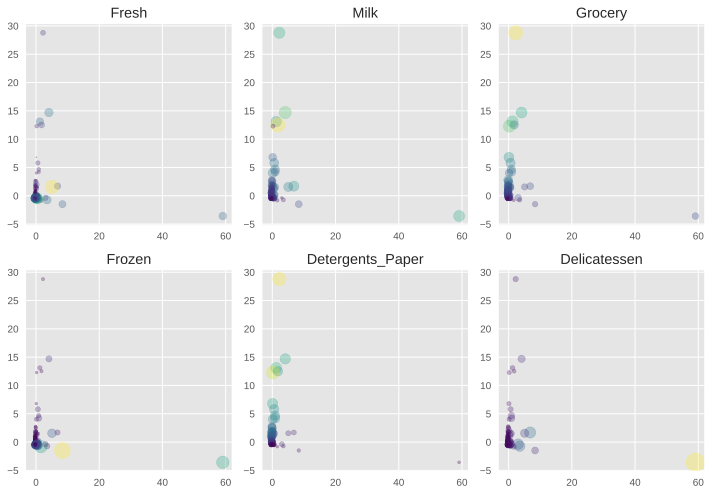

In [24]:
fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20 + 20 * data[:, features.index(feature)]
    ax.scatter(res_kpca_poly[:, 0], 
               res_kpca_poly[:, 1], 
               s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)

plt.tight_layout();

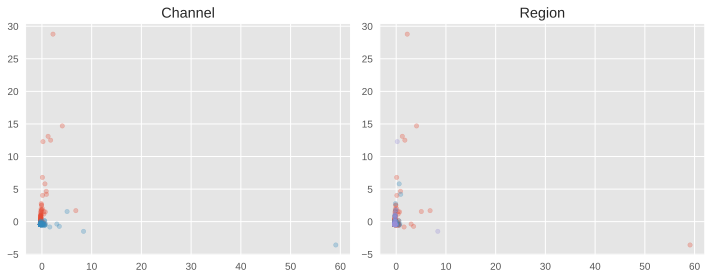

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20 
    
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_poly[df[feature]==unique_val, 0], 
                   res_kpca_poly[df[feature]==unique_val, 1], 
                   s=sizes, alpha=0.3)
        ax.set_title(feature)

plt.tight_layout();

### Radial Basis Function

In [26]:
kpca = KernelPCA(n_components=2, kernel='rbf')
res_kpca_rbf = kpca.fit_transform(data)

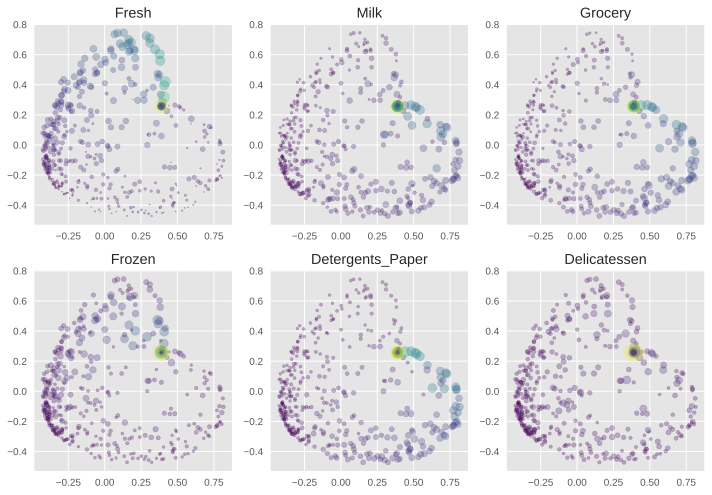

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(10,7))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20 + 20 * data[:, features.index(feature)]
    
    ax.scatter(res_kpca_rbf[:, 0], 
               res_kpca_rbf[:, 1],
               s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)

plt.tight_layout();

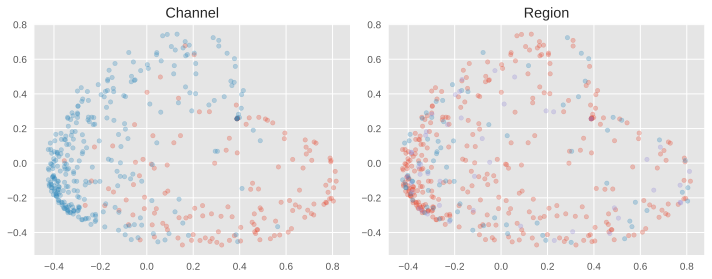

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20 
    
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0], 
                   res_kpca_rbf[df[feature]==unique_val, 1], 
                   s=sizes, alpha=0.3)
        ax.set_title(feature)

plt.tight_layout();

In [29]:
# try with gamma parameter
kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
res_kpca_rbf = kpca.fit_transform(data)

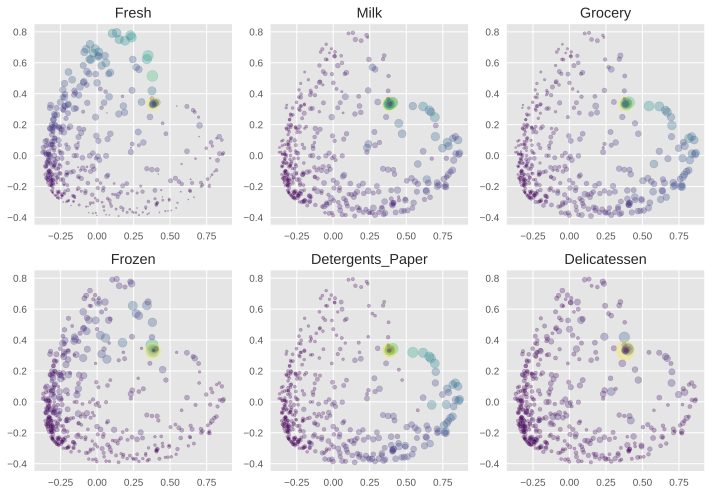

In [30]:
fig, axes = plt.subplots(2, 3, figsize=(10,7))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20 + 20 * data[:, features.index(feature)]
    
    ax.scatter(res_kpca_rbf[:, 0], 
               res_kpca_rbf[:, 1],
               s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)

plt.tight_layout();

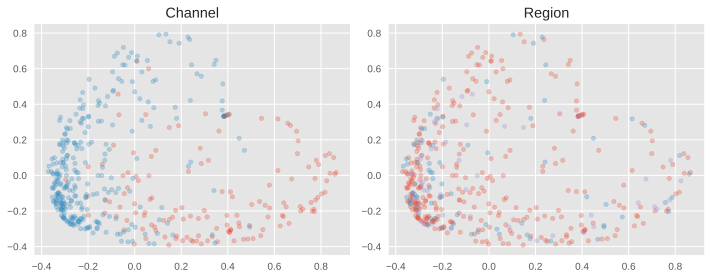

In [31]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20 
    
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0], 
                   res_kpca_rbf[df[feature]==unique_val, 1], 
                   s=sizes, alpha=0.3)
        ax.set_title(feature)

plt.tight_layout();

### Cosine Function

In [32]:
kpca = KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos = kpca.fit_transform(data)

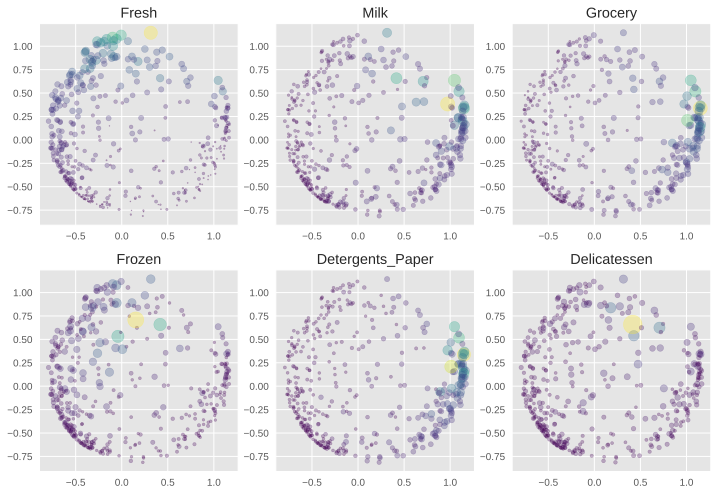

In [33]:
fig, axes = plt.subplots(2, 3, figsize=(10,7))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20 + 20 * data[:, features.index(feature)] 
    ax.scatter(res_kpca_cos[:, 0], 
               res_kpca_cos[:, 1],
               s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)

plt.tight_layout();

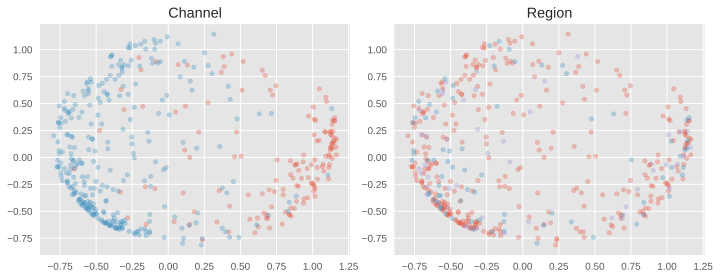

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20 
    
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_cos[df[feature]==unique_val, 0], 
                   res_kpca_cos[df[feature]==unique_val, 1], 
                   s=sizes, alpha=0.3)
        ax.set_title(feature)

plt.tight_layout();

### Append the PCA results to the DataFrame

In [35]:
df['x_kpca_poly'] = res_kpca_poly[:, 0]
df['y_kpca_poly'] = res_kpca_poly[:, 1]

df['x_kpca_rbf'] = res_kpca_rbf[:, 0]
df['y_kpca_rbf'] = res_kpca_rbf[:, 1]

df['x_kpca_cos'] = res_kpca_cos[:, 0]
df['y_kpca_cos'] = res_kpca_cos[:, 1]

df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.066075,-0.135436,0.504789,0.009622
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.162858,-0.235205,0.889941,-0.262833
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.286224,0.066387,0.473994,0.235687
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.253849,0.173058,-0.618611,0.370131
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,0.048001,0.341762,0.068900,0.861829


In [36]:
# save new df

df.to_csv('data_with_latent.csv', index=False)

## 5: K-Means Clustering

Overall, the cosine function allowed for better separation of the PCs. Consequently, I am going to use it for dimensionality reduction before clustering.

In [37]:
# select the best dimension reducer
res_kpca = df[['x_kpca_cos', 'y_kpca_cos']].to_numpy()

In [38]:
cluster_func = KMeans(n_clusters=5)
clusters = cluster_func.fit_predict(res_kpca)

In [39]:
clusters[:5]

array([3, 1, 1, 4, 2], dtype=int32)

In [40]:
markers = list('*hH+xXDd|.,ov^<>12348spP')

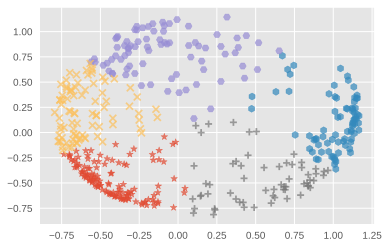

In [41]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], 
                cluster_data[:, 1],
                alpha=0.7,
                marker=markers[cluster])

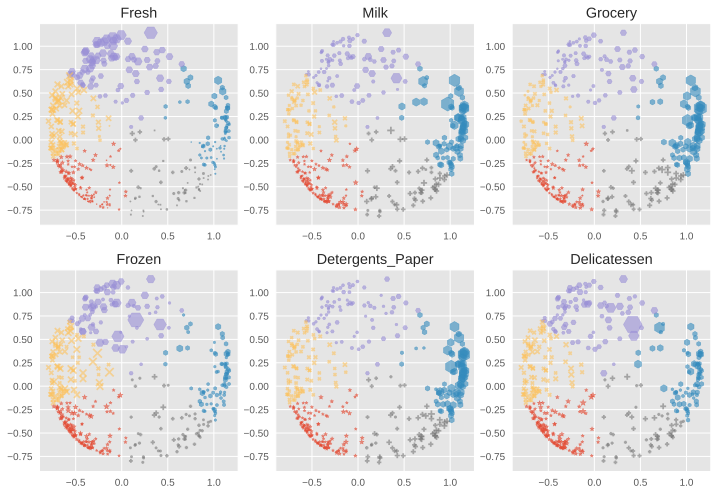

In [42]:
fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        cluster_data = res_kpca[clusters==cluster]
        sizes = 20+20*data[:, features.index(feature)][clusters==cluster]
        ax.scatter(cluster_data[:, 0], 
                   cluster_data[:, 1],
                   s=sizes, alpha=0.6, cmap=cmap,
                   marker=markers[cluster])
        pass
    ax.set_title(feature)
    
plt.tight_layout();

In [43]:
# append clusters to DataFrame and save to file
df['cluster_kpca_cos'] = clusters
df.to_csv('data_with_clusters.csv')

### Elbow Method
Find the optimal k

In [44]:
KElbowVisualizer?

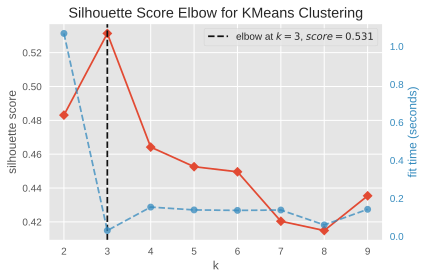

In [45]:
cluster_func = KMeans()
visualizer = KElbowVisualizer(cluster_func, k=(2,10), metric='silhouette')
visualizer.fit(res_kpca)
visualizer.show()

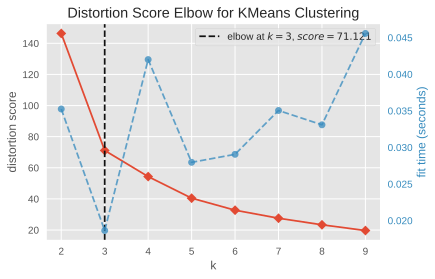

In [46]:
cluster_func = KMeans()
visualizer = KElbowVisualizer(cluster_func, k=(2,10), metric='distortion')
visualizer.fit(res_kpca)
visualizer.show();

## Task 6: Interactive Cluster Analysis
Let's see if there's a ncier way for us to compare our separate clusters.

In [47]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.066075,-0.135436,0.504789,0.009622,3
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.162858,-0.235205,0.889941,-0.262833,1
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.286224,0.066387,0.473994,0.235687,1
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.253849,0.173058,-0.618611,0.370131,4
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,0.048001,0.341762,0.068900,0.861829,2


### Clusters Distribution

In [48]:
df.groupby(['cluster_kpca_cos','Channel','Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_cos Channel Region                                             
0                HoReCa  Lisbon   5899.782609   2275.304348   2553.260870   
                         Other    4783.355556   2379.733333   2588.477778   
                         Porto    6042.916667   1783.500000   4275.416667   
                 Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                         Other   10750.000000   3468.666667   6065.333333   
                         Porto    7839.000000   2548.000000   6110.000000   
1                HoReCa  Lisbon   6364.666667  17421.333333  11328.333333   
                         Other   11908.500000  15602.500000  14858.000000   
                 Retail  Lisbon   4302.166667  13440.833333  23713.250000   
                         Other    9260.603774  15728.924528  22173.962264   
                         Porto    4998.900000  12905.200000  23565.600000   
2                HoReCa  Lisbon  35193.000000   4892.444444   6189.333333   
                         Other   32110.039216   5599.333333   5767.372549   
                         Porto   29443.000000   7568.666667   8123.333333   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   23938.461538   6279.923077   9520.230769   
                         Porto   20117.666667   4662.666667   6631.000000   
3                HoReCa  Lisbon   3218.333333   7438.166667   7476.500000   
                         Other    2835.500000   6629.625000   8714.687500   
                 Retail  Lisbon   2443.333333   6128.333333   9281.333333   
                         Other    4539.060606   6606.030303  10429.969697   
                         Porto    3121.500000   6622.250000  10607.750000   
4                HoReCa  Lisbon  15022.055556   1949.166667   2459.388889   
                         Other   15210.961538   1898.692308   2381.750000   
                         Porto   12720.846154   1570.076923   3646.076923   
                 Retail  Other   16085.666667   3109.666667   4594.000000   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_cos Channel Region                                                
0                HoReCa  Lisbon   1647.913043        882.260870    635.043478  
                         Other    1629.733333        516.666667    884.477778  
                         Porto    1760.250000        513.583333    792.500000  
                 Retail  Lisbon   5612.000000        788.000000   1360.000000  
                         Other    1101.333333       3235.666667    336.333333  
                         Porto     936.000000       2960.000000    392.500000  
1                HoReCa  Lisbon   5405.000000       2735.000000   3096.333333  
                         Other    3388.000000       2680.500000   3507.000000  
                 Retail  Lisbon   2153.000000      10679.750000   2188.833333  
                         Other    1778.943396       9987.754717   2207.358491  
                         Porto    1106.200000      12201.800000   1326.400000  
2                HoReCa  Lisbon   6391.555556        569.555556   2702.222222  
                         Other    7879.215686        878.039216   3412.960784  
                         Porto   22094.666667        594.333333   2272.666667  
                 Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                         Other    2133.923077       2765.538462   2451.846154  
                         Porto    4582.666667       2368.333333   2543.333333  
3                HoReCa  Lisbon   1071.666667       2718.500000    960.000000  
                         Other    1316.000000       2991.125000   1075.000000  
                 Retail  Lisbon   1662.000000       5195.666667    793.000000  
                         Other     909.454545       4387.848485   1169.393939  
                         Porto     647.2500

In [49]:
clusters = df.cluster_kpca_cos.tolist()

In [50]:
df_norm = df.copy(deep=True)
df_norm[features] = df_norm[features] / df_norm[features].max()
df_norm.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,0.112964,0.131378,0.081494,0.003516,0.065496,0.027908,-0.298146,-0.307672,0.066075,-0.135436,0.504789,0.009622,3
1,Retail,Other,0.062924,0.133473,0.103126,0.028947,0.080657,0.037044,-0.272613,-0.248762,0.162858,-0.235205,0.889941,-0.262833,1
2,Retail,Other,0.056647,0.119840,0.082820,0.039511,0.086119,0.163611,0.557870,-0.356102,0.286224,0.066387,0.473994,0.235687,1
3,HoReCa,Other,0.118278,0.016273,0.045495,0.105210,0.012418,0.037294,-0.263419,-0.454023,-0.253849,0.173058,-0.618611,0.370131,4
4,Retail,Other,0.201648,0.073607,0.077581,0.064318,0.043525,0.108149,0.126922,-0.432733,0.048001,0.341762,0.068900,0.861829,2


In [51]:
biggest_cluster = df.groupby('cluster_kpca_cos').count().max().max()
biggest_cluster

131

In [ ]:
fig = go.Figure()

for cluster in np.unique(clusters):
    radii = df_norm.loc[df_norm.cluster_kpca_cos==cluster, features].mean().tolist()
    thetas = features
    actual_values = df.loc[df.cluster_kpca_cos==cluster, features].mean()
    cluster_size = len(df[df.cluster_kpca_cos==cluster])
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster{cluster}',
            text=[f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            opacity= np.max([0.6, cluster_size/biggest_cluster]),
            line=dict(width=np.max([1, 4*cluster_size/biggest_cluster]))
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    width=600,
    template='plotly_dark',
    autosize=False
)
        
#fig.show()
fig.write_html('clusters.html')

![clusters](clusters.png)

## Summary
The goal of this project was to cluster the customers of a grocery store based on their transactions and other characteristics using KMeans clustering. Five customer [clusters](clusters.html) were found:

<ul>
  <li>Cluster 0: Customers that buy items from all categories, but mostly spend money on fresh food. Consumers in this cluster have the lowest spending power of all clusters</li>
  <li>Cluster 1: Customers with high spending power, who mostly buy detergent, grocey and dairy from the store</li>
  <li>Cluster 2: Customers with high spending power, that buy mostly fresh and frozen foods from the store</li>
  <li>Cluster 3: Similar spending habits as customers in Cluster 1, with lower spending power</li>
  <li>Cluster 4: Similar spending habits as customers in Cluster 2 with lower spending power</li>
</ul>

If the store was to use this to fine-tune their next campaign, they could should focus their attention to customers in clusters 1, 2 and 3 to see a boost in sales.